# Math 761 HW 6: MCMC, Gibbs Sampler, MH

## General Instructions

_This homework requires you two submit two things now and one thing later:_

1) A jupyter notebook (.ipynb file) which will include your code, the results from when you ran the code, and textual interpetations as asked in the questions.

2) A video (15 minute max).  Each question specifies the part you need to explain by video. For example, if part a of question 1 says "**Explain in Video**", then after you have finished writing up your work **(which may include math calculations as well as code)** to your satisfaction (or to the point where you have to submit before the deadline!), please record a video where you go over your work (math and code) and explain what each part of it does and the role each part plays in helping you to achieve the statistical goal of the question. Note that the whole video you submit for your whole assignment should be 10 minutes or less. If your video goes over the max limit, I will only grade or give feedback up to the max limit. This is so that I can give everyone feedback in a timely manner. It may be helpful if you rehearse your video before you record it or use a video editor (Da Vinci is free) to help you keep your video under the time limit while letting you cover all the important information you want to explain.

3) After I give you feedback on the homework, you'll submit your own scoring of your corrected work, where you should also explain why you gave yourself each rubric score. Please submit your corrected work with this.

_This homework also has a metacognitive component that asks you to reflect on your own learning_:
To give you the opportunity and encourage you to reflect on your own work, learn from mistakes, and reward you for improving, for the last two questions of each homework, I will provide you feedback but no grade. Instead, you will be able to take the feedback to improve your work. Then you will self-assess using the rubric provided. This you will simply need to submit before the midterm. There will be a submission link on MyOpenMath for you before then.

<br>

_Grading_:
The two grading rubrics (how I will grade and the rubric you will use to self-assess your improvements) are here https://docs.google.com/document/d/10LMcqYt0DyPNxOYassnZGB6-qAB0KGw_g5j2WHp6-LE/edit?usp=sharing. The grade you will see for this homework will be the grade that I provide on my two questions. However, they are only worth 50% of your HW grade. You will submit your self-assessment (before the midterm), which you should also save for your "portfolio". At the end of the term, we will meet for 5-10 minutes to go over your portfolio so that you can tell me how you evaluate your own improvements and how you graded yourself. Based on this we will come up with the other 50% of your overall HW grade.




<br>

### Exercise 1

**Explain in Video**

Look at Rizzo Example 9.7 (first edition) or 11.10 (second edition) about generating a bivariate normal distribution with correlation -0.75.

We can instead use the ***random scan*** Gibbs sampler, but there is a question about how the random scan affects the burn in period since we are no longer sampling from both coordinates for each step.

a) Try to implement the random scan Gibbs sampler using the same number of burn-ins and saved runs as in the example, and plot the resulting sample.

**hint:** Your plot should look like the one in this link:
https://docs.google.com/document/d/1TgS0zYPy0N0gK0JqVDv6rR9KEvXHbDNZi0-jSs2C2RM/edit?usp=sharing

b) Then experiment with the random scan using different burn-ins but (10*burn-in) for the number of saved runs. What is the size of the burn-in that you need to get a plot similar to what you get for the deterministic scan?


### (a)

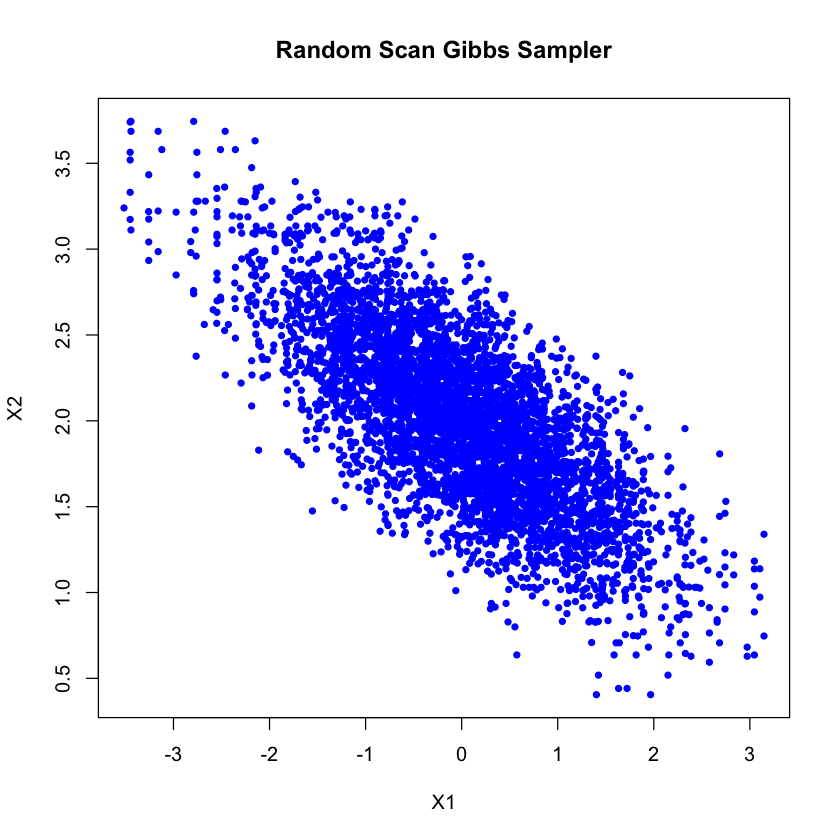

In [113]:
#Set seed 
set.seed(1)

#Define parameters
mu1 = 0
mu2 = 2
corr = -0.75
sigma1 = 1
sigma2 = 0.5
s1 = sqrt(1- corr^2)*sigma1
s2 = sqrt(1- corr^2)*sigma2
burnIn = 1000
runs = 5000
total_runs = burnIn + runs

#Initialize null vectors to store X1 and X2
X1 = rep(NA, times = total_runs)
X2 = rep(NA, times = total_runs)

#Set the initial values to 0, 0
X1[1] = 0
X2[1] = 0

#Run the burnIn
for(i in 2:burnIn){
    u = runif(1)
    if(u<=0.5){
        X1[i] <- rnorm(1, mean = mu1 + (corr*(sigma1/sigma2)*(X2[i-1] - mu2)), sd = s1)
        X2[i] <- X2[i-1]
    }
    else{
        X1[i] <- X1[i-1]
        X2[i] <- rnorm(1, mean = mu2 + (corr*(sigma2/sigma1)*(X1[i-1] - mu1)), sd = s2)
    }
}

#Run for the actual runs
for(i in (burnIn+1):total_runs){
    u = runif(1)
    if(u<=0.5){
        X1[i] <- rnorm(1, mean = mu1 + (corr*(sigma1/sigma2)*(X2[i-1] - mu2)), sd = s1)
        X2[i] <- X2[i-1]
    }
    else{
        X1[i] <- X1[i-1]
        X2[i] <- rnorm(1, mean = mu2 + (corr*(sigma2/sigma1)*(X1[i-1] - mu1)), sd = s2)
    }
}
#Discard first 1000 samples, because they are the samples from burnIn
X1_final <- X1[(burnIn+1):length(X1)]
X2_final <- X2[(burnIn+1):length(X2)]

#Plot the scatter plot
plot(X1_final, X2_final, main="Random Scan Gibbs Sampler", col = "blue", xlab = "X1", ylab = "X2", pch = 20)


### (b)

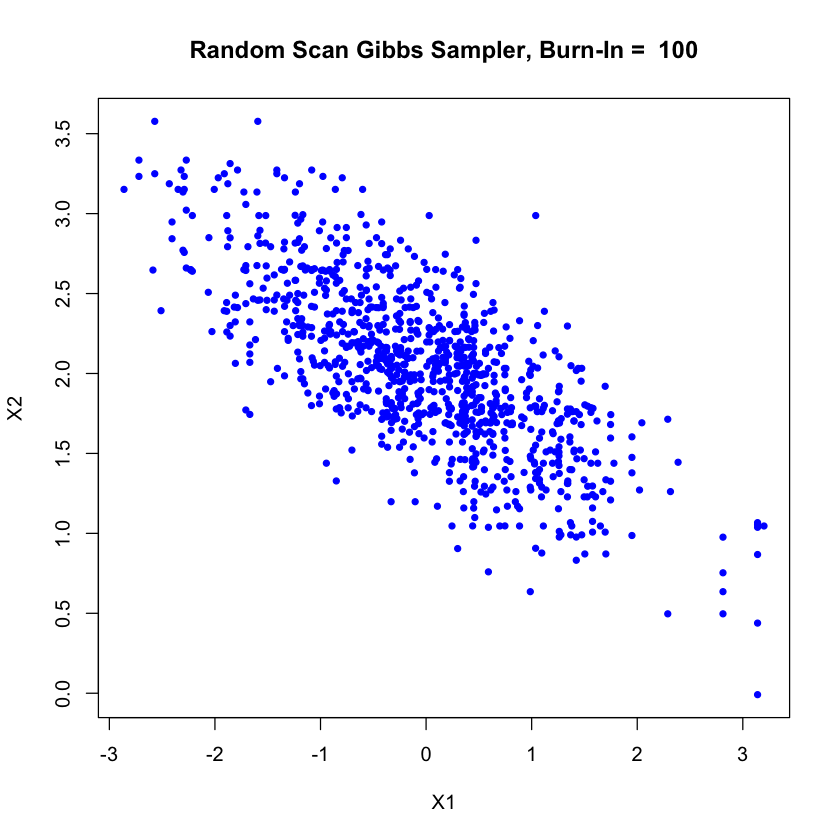

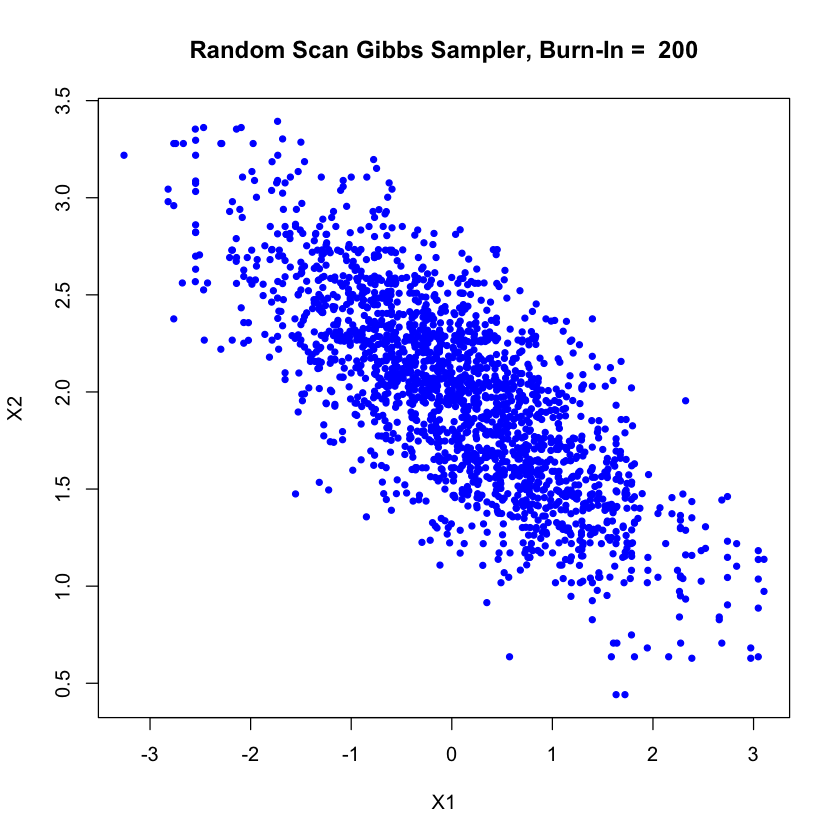

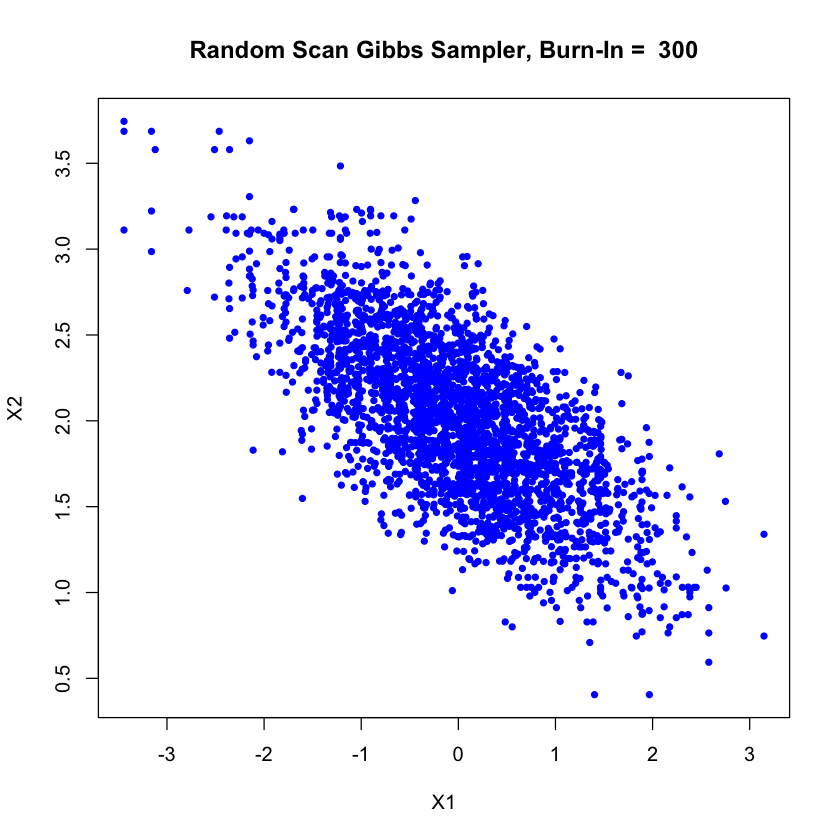

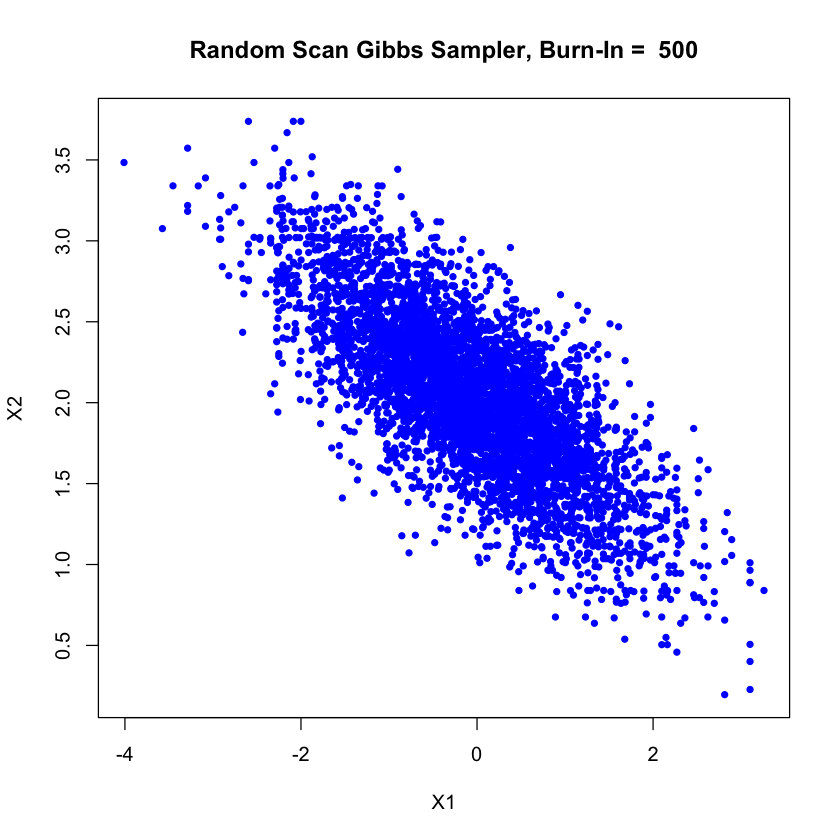

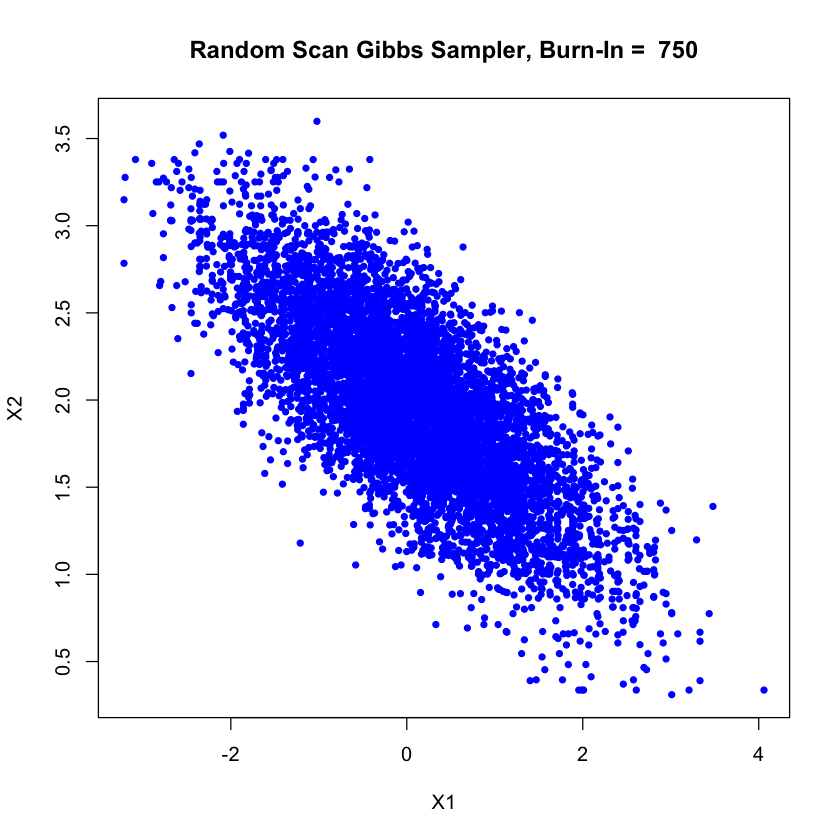

In [114]:
#Set seed 
set.seed(1)

#Define parameters
mu1 = 0
mu2 = 2
corr = -0.75
sigma1 = 1
sigma2 = 0.5
s1 = sqrt(1- corr^2)*sigma1
s2 = sqrt(1- corr^2)*sigma2
burnIn = c(100, 200, 300, 500, 750)
runs = 10*burnIn
total_runs = burnIn + runs

for(b in 1:length(burnIn)){
    #Initialize null vectors to store X1 and X2
    X1 = rep(NA, times = total_runs[b])
    X2 = rep(NA, times = total_runs[b])
    
    #Set the initial values to 0, 0
    X1[1] = 0
    X2[1] = 0
    
    #Run the burnIn
    for(i in 2:burnIn[b]){
        u = runif(1)
        if(u<=0.5){
            X1[i] <- rnorm(1, mean = mu1 + (corr*(sigma1/sigma2)*(X2[i-1] - mu2)), sd = s1)
            X2[i] <- X2[i-1]
        }
        else{
            X1[i] <- X1[i-1]
            X2[i] <- rnorm(1, mean = mu2 + (corr*(sigma2/sigma1)*(X1[i-1] - mu1)), sd = s2)
        }
    }
    #Run for the actual runs
    for(i in (burnIn[b]+1):total_runs[b]){
        u = runif(1)
        if(u<=0.5){
            X1[i] <- rnorm(1, mean = mu1 + (corr*(sigma1/sigma2)*(X2[i-1] - mu2)), sd = s1)
            X2[i] <- X2[i-1]
        }
        else{
            X1[i] <- X1[i-1]
            X2[i] <- rnorm(1, mean = mu2 + (corr*(sigma2/sigma1)*(X1[i-1] - mu1)), sd = s2)
        }
    }

    #Discard first 1000 samples, because they are the samples from burnIn
    X1_final <- X1[(burnIn[b]+1):length(X1)]
    X2_final <- X2[(burnIn[b]+1):length(X2)]
    
    #Plot the scatter plot
    plot(X1_final, X2_final, main= paste("Random Scan Gibbs Sampler, Burn-In = ", burnIn[b]), col = "blue", xlab = "X1", ylab = "X2", pch = 20)
    
}

Over 5 scatter plots are generated for burn-ins 100, 200, 300, 500 and 750. For the burn-in 100, the scatter plot looks similar to that of the deterministic scan one mentioned in the textbook. As the burnIns increases, the scatter plot is being converged more and more.  

### Exercise 2

**Explain in Video**

Verify that Gibbs sampling satisfies detailed balance in the sense that sampling from each component conditional on the other components satisfies detailed balance. Without loss of generality, you can assume that we're using the deterministic Gibbs sampler. Please show all your work!

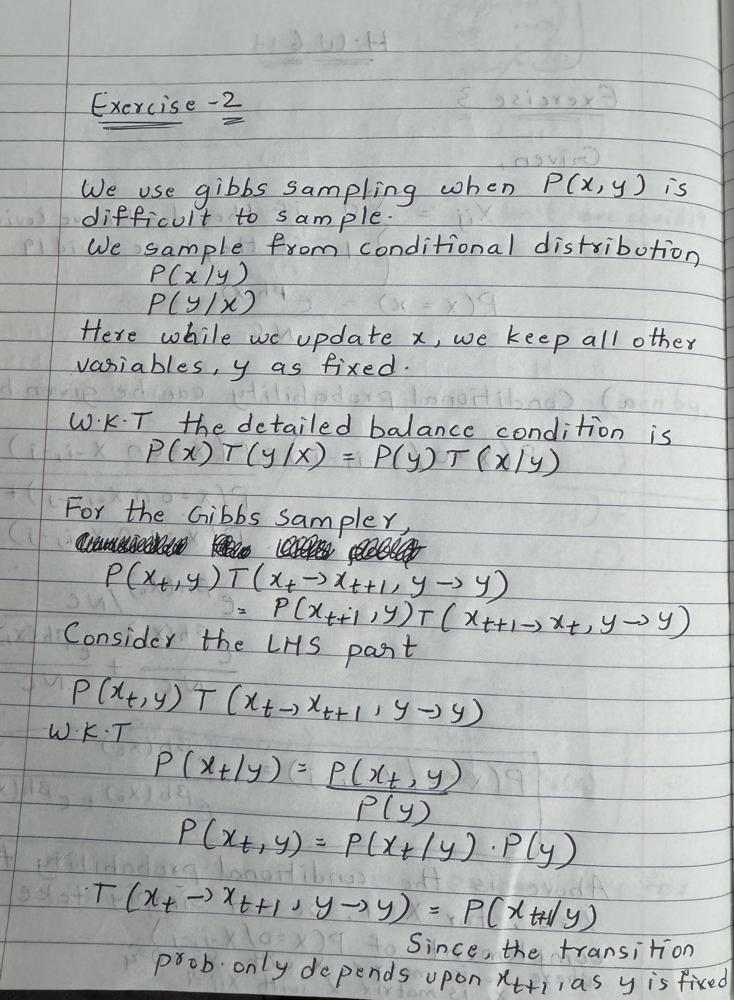

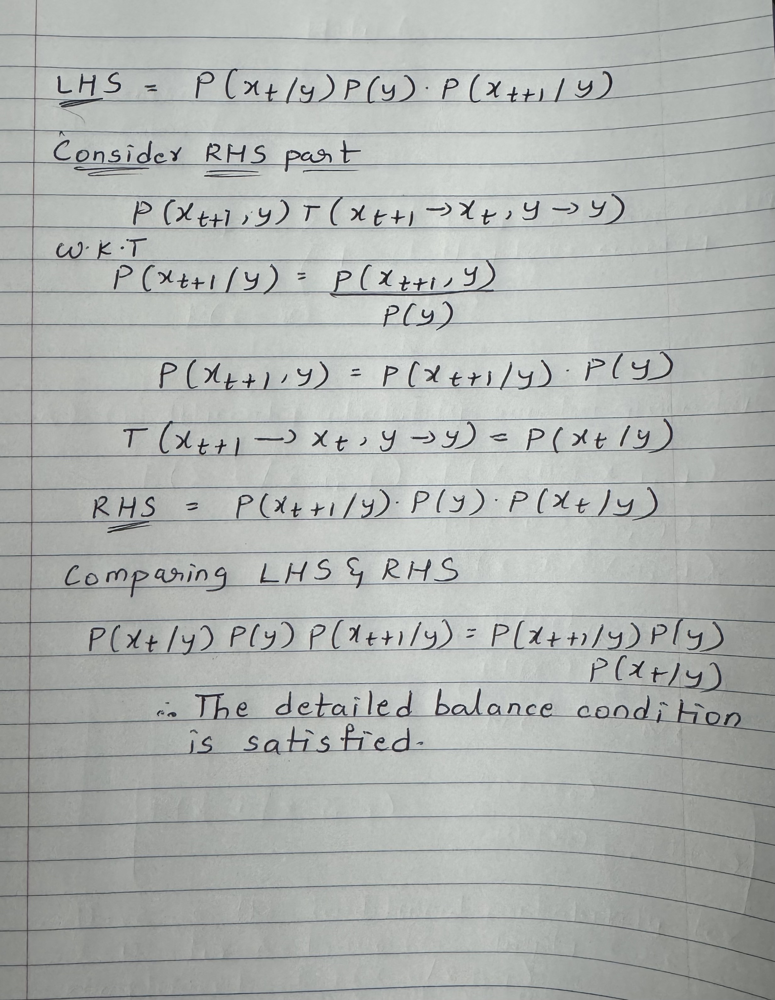

### Exercise 3


**Explain in Video**

Cosider a scenario where 16 people stand in a  4x4 grid $\textbf{X}$ and the Covid status of each person is recorded. One random instance of $\textbf{X}$ is shown below: 

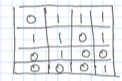
where the person in the $ith$ row and $jth$ column  is 

$$
X_{i, j} = 
\begin{cases}
0 & \text{ if they don't have Covid19}\\
1 & \text{ if they have Covid19}
\end{cases}
$$

and the configuration of the grid is determined by the probability model

$$
P\{X = x\} = \frac{e^{\beta h}}{NC},
$$

where $\beta>0$ is a constant; $NC$ is a normalizing constant that makes the total probability sum to 1; and $H(\textbf{X}) = h$ is the sum of number of neighbors each person has (up, down, left, right) that share the same health status. If a person is on an edge or corner, then they may not have some of these neighbors. In the example of
$\textbf{X}$ shown above, $h(\textbf{X}) = 24$ because

| $X_{i,j}$    | Number of same-status neighbors |
|-------------|---------------------------------|
| $X_{1,1}$   | 0                               |
| $X_{1,2}$   | 2                               |
| $X_{1,3}$   | 2                               |
| $X_{1,4}$   | 2                               |
| $X_{2,1}$   | 1                               |
| $X_{2,2}$   | 3                               |
| $X_{2,3}$   | 1                               |
| $X_{2,4}$   | 1                               |
| $X_{3,1}$   | 1                               |
| $X_{3,2}$   | 1                               |
| $X_{3,3}$   | 3                               |
| $X_{3,4}$   | 1                               |
| $X_{4,1}$   | 2                               |
| $X_{4,2}$   | 2                               |
| $X_{4,3}$   | 2                               |
| $X_{4,4}$   | 0                               |
| $sum$ | 24                              |

To be extra clear, we get the numbers in the table like so:  the person in the 2nd row and 3rd column is $X_{2,3}$ and has status 0. If we look above, below, left, and right (exclude diagonals) of this person, there is only one other person who shares the same Covid status of 0 ($X_{3,3}$). Therefore the number of same-status neighbors $X_{2,3}$ is 1. We tally up the same-status neighbors for each person in the grid and that value is  $h(\bf{X})$.

Now our goal is to estimate $P\{H(\textbf{X})\leq 11\}.$ You can probably tell that it is difficult to generate a bunch of 4x4 grids $\textbf{X}$ directly in order to then calculate what proportion of times $H({X})$ is less than 11. So we will use Gibbs sampling instead to swap between {0,1} status for each person $X_{i,j}$ in turn.


a) First, figure out what the conditional probability is for any $X_{i,j}$ to be 0 or 1 by finding the conditional probability of $P\{\textbf{X}=x|X_{-i,-j}\}$, where the given $X_{-i,-j}$ represents the fixed covid-statuses of everyone except the (i,j)th person, that is, the rest of the matrix is fixed besides $X_{i, j}$. Hint: $h$ can only take on two different values.


b) Create a deterministic Gibbs sampler using a burn-in of 1000 and $\beta=1/4$. For your results, try to estimate  $P\{\textbf{H(X)}\leq 11\};$  $P\{\textbf{H(X)}\leq 15\}$ ; and  $P\{\textbf{H(X)}\leq 20\}$ using 50 replications of your MCMC code. Report in one table the mean and se for each estimate over the 50 replications. (Thank you!)

**hint:** When I set the seed to 1, I get `0.030442` for my estimate of $P(H(X) \leq 20)$. Your value should be pretty close even if it isn't the same because you sampled a little differently.

### (a)

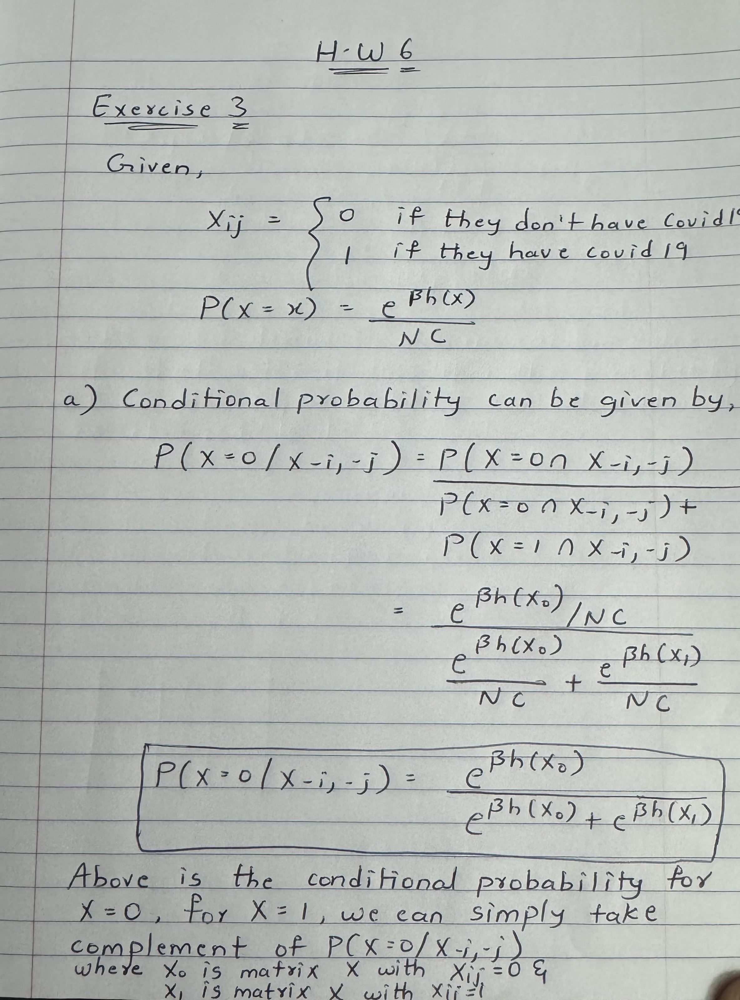

### (b)

In [115]:
# Define h(X)
h <- function(X){
    #Store number of rows and number of columns information of a matrix
    maxRow = nrow(X)
    maxCol = ncol(X)
    #Initialize the result to 0
    res = 0
    #Iterate through the matrix and check for number of nearest neighbours
    for(i in 1:maxRow){
        for(j in 1:maxCol){
            Xij = X[i,j]
            #Checking the first row
            if(i==1){
                #Checking the first column
                if(j==1){
                    if(X[i,j+1] == Xij){
                        #incrementing the result by 1 if the neighbour's health status is similar to the current person
                        res = res+1
                    }
                    if(X[i+1, j] == Xij){
                        res = res+1
                    }
                }
                #Checking the columns between first and last
                else if(j<maxCol){
                    if(X[i,j+1] == Xij){
                        res = res+1
                    }
                    if(X[i+1, j] == Xij){
                        res = res+1
                    }
                    if(X[i, j-1] == Xij){
                        res = res+1
                    }
                }
                #Checking the last column    
                else{
                    if(X[i+1, j] == Xij){
                        res = res+1
                    }
                    if(X[i, j-1] == Xij){
                        res = res+1
                    }
                    
                }
            }
            #Checking the rows between first and last
            else if(i<maxRow){
                    #Checking the first column
                    if(j==1){
                        if(X[i,j+1] == Xij){
                            res = res+1
                        }
                        if(X[i+1, j] == Xij){
                            res = res+1
                        }
                        if(X[i-1, j] == Xij){
                            res = res+1
                        }
                    }
                    #Checking the columns between first and last
                    else if(j<maxCol){
                        if(X[i,j+1] == Xij){
                            res = res+1
                        }
                        if(X[i+1, j] == Xij){
                            res = res+1
                        }
                        if(X[i, j-1] == Xij){
                            res = res+1
                        }
                        if(X[i-1,j] == Xij){
                            res = res+1
                        }
                    }
                    #Checking the last column
                    else{
                        if(X[i+1, j] == Xij){
                            res = res+1
                        }
                        if(X[i, j-1] == Xij){
                            res = res+1
                        }
                        if(X[i-1, j] == Xij){
                            res = res+1
                        }
                    }
                }
            #Checking the last row
            else{
                #Checking the first column
                if(j==1){
                    if(X[i,j+1] == Xij){
                        res = res+1
                    }
                    if(X[i-1, j] == Xij){
                        res = res+1
                    }
                }
                #Checking the columns between first and last
                else if(j<maxCol){
                    if(X[i,j+1] == Xij){
                        res = res+1
                    }
                    if(X[i-1, j] == Xij){
                        res = res+1
                    }
                    if(X[i, j-1] == Xij){
                        res = res+1
                    }
                }
                #Checking the last column
                else{
                    if(X[i-1, j] == Xij){
                        res = res+1
                    }
                    if(X[i, j-1] == Xij){
                        res = res+1
                    }
                    
                }
                    
            }
        }
    }
    #Returning the final result
    return(res)
}
        

In [116]:
#Define update matrix function - This function is used to check and transform the given matrix according to the grid configuration
update_matrix <- function(X, beta){
    #Iterate through the rows and columns of the matrix
    for(i in 1:nrow(X)){
        for(j in 1:ncol(X)){
            Xij = X[i,j]
            #Defining the alternate version of the given matrix
            altX = X
            altX[i,j] = ifelse(Xij==0,1,0)
            #Generate a uniform random variable
            u = runif(1)
            #Check if the generated random number is greater than the computed probability distribution
            if(u > (exp(beta*h(X)) / (exp(beta*h(X)) + exp(beta*h(altX))))){
                X[i,j] = altX[i,j]
            }
        }
    }
    #Return the transformed matrix
    return(X)
}


In [117]:
#Set seed
set.seed(1)

#Generate a random matrix using rbinom function
seed_matrix = matrix(rbinom(n= 16, size=1, prob=0.5), nrow=4)

#Define the required parameters
beta = 1/4
burnIn = 1000
runs = 10*burnIn
reps = 50

#Define empty vectors to store the mean results 
estimate_11 = rep(NA, times=reps)
estimate_15 = rep(NA, times=reps)
estimate_20 = rep(NA, times=reps)

#Initialize the transformed matrix as seed matrix
transformed_matrix = seed_matrix
#Run the burnIn and final simulations 50 times 
for(rep in 1:reps){
    #Run for the Burn-in
    for(i in 1:burnIn){
        transformed_matrix = update_matrix(transformed_matrix, beta)
    }
    #Initialize a result vector which stores all 10000 runs results
    result = rep(NA, times=runs)
    
    #Run the final simulations
    for(i in 1:runs){
        transformed_matrix = update_matrix(transformed_matrix, beta)
        result[i] = h(transformed_matrix)
    }
    estimate_11[rep] = mean(result<=11)
    estimate_15[rep] = mean(result<=15)
    estimate_20[rep] = mean(result<=20)
}

#Compute the mean and standard error for each estimate over 50 replications
mean_11 = mean(estimate_11)
mean_15 = mean(estimate_15)
mean_20 = mean(estimate_20)

sd_11 = sd(estimate_11)
sd_15 = sd(estimate_15)
sd_20 = sd(estimate_20)

#Tabulate the results
resultant_table = data.frame(Estimate = c("<= 11", "<= 15", "<= 20"), Mean = c(mean_11, mean_15, mean_20), 
                             Standard_Error = c(sd_11, sd_15, sd_20))

resultant_table

Estimate,Mean,Standard_Error
<chr>,<dbl>,<dbl>
<= 11,0.000060,6.060915e-05
<= 15,0.000986,3.263965e-04
<= 20,0.030020,1.990488e-03


### Exercise 4


**Explain in Video**

We can actually use the MH sampler to carry out sampling in the 4x4 gride model. For this, use a proposal distribution that uniformly picks 1 amongst all the people on the grid and uniformly chooses a 0 or 1 health status for that person, that is

$$ g(X_{t+1}|X_{t}) = g(X_{t+1}) = \frac{1}{16*2}.
$$

a) Calculate the acceptance probability

b) Then estimate  $P\{H(\textbf{X})\leq 11\};$  $P\{H(\textbf{X})\leq 15\}$ ; and  $P\{H(\textbf{X})\leq 20\}$ using 50 replications of your MCMC code using the MH sampler. Report in one table the mean and se for each estimate over the 50 replications.

**hint:** When I set the seed to 1, I get `0.030986` for $P(H(X) \leq 20)$. Your value should be pretty close even if it isn't the same because you sampled a little differently.

### Remember please
to do your self-reflection (see rubric) where you assess which work you have done where you have a stronger understanding about and which you are less confident in.

### (a)

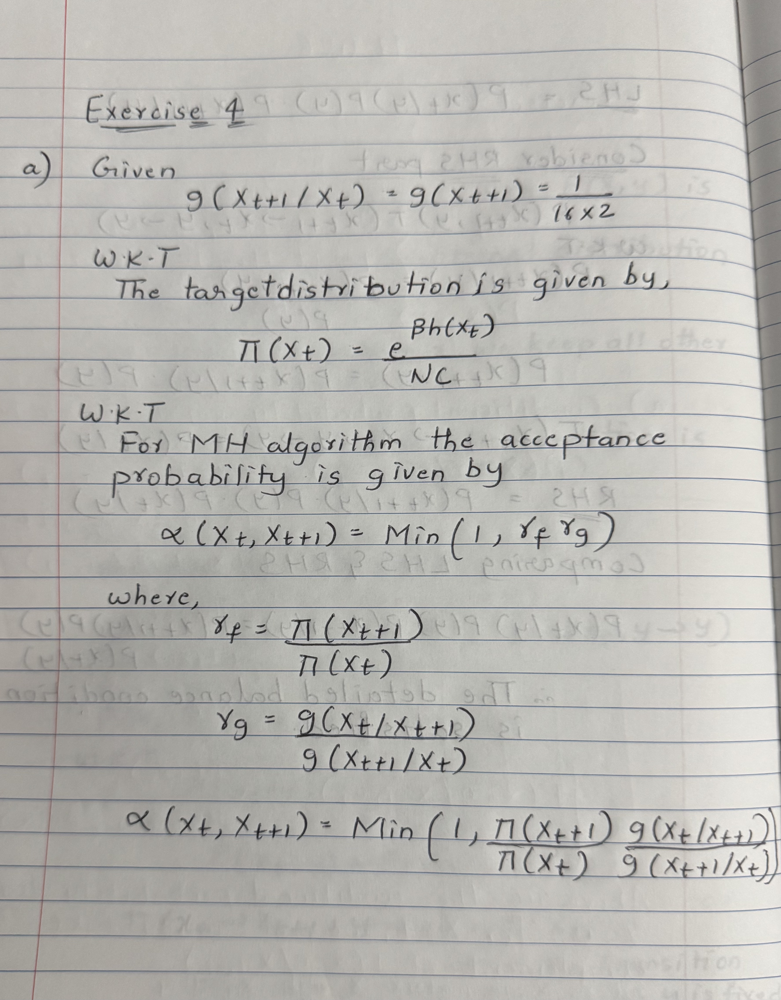

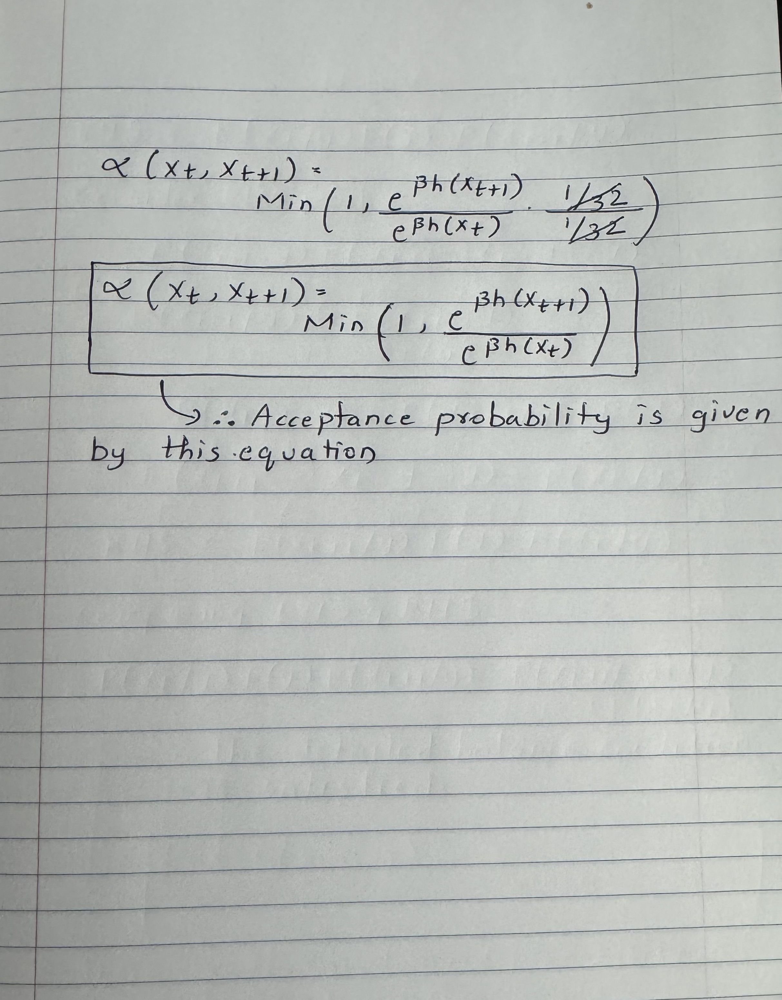

### (b)

In [118]:
#Define update matrix function for metropolis hastings algorithm
update_matrix_mh <- function(X, beta){
    row = sample(1:nrow(X), size=1)
    col = sample(1:ncol(X), size=1)
    altX = X
    altX[row, col] = ifelse(X[row,col] == 0, 1, 0)
    alpha = min(1, (exp(beta*h(altX)))/(exp(beta*h(X))))
    u = runif(1)
    if(u < alpha){
        return(altX)
    }
    else{
        return(X)
    }
}

In [119]:
#Set seed
set.seed(1)

#Generate a random matrix using rbinom function
seed_matrix = matrix(rbinom(n= 16, size=1, prob=0.5), nrow=4)

#Define the required parameters
beta = 1/4
burnIn = 1000
runs = 10*burnIn
reps = 50

#Define empty vectors to store the mean results 
estimate_11 = rep(NA, times=reps)
estimate_15 = rep(NA, times=reps)
estimate_20 = rep(NA, times=reps)

#Initialize the transformed matrix as seed matrix
transformed_matrix = seed_matrix
#Run the burnIn and final simulations 50 times 
for(rep in 1:reps){
    #Run for the Burn-in
    for(i in 1:burnIn){
        transformed_matrix = update_matrix_mh(transformed_matrix, beta)
    }
    #Initialize a result vector which stores all 10000 runs results
    result = rep(NA, times=runs)
    
    #Run the final simulations
    for(i in 1:runs){
        transformed_matrix = update_matrix_mh(transformed_matrix, beta)
        result[i] = h(transformed_matrix)
    }
    estimate_11[rep] = mean(result<=11)
    estimate_15[rep] = mean(result<=15)
    estimate_20[rep] = mean(result<=20)
}

#Compute the mean and standard error for each estimate over 50 replications
mean_11 = mean(estimate_11)
mean_15 = mean(estimate_15)
mean_20 = mean(estimate_20)

sd_11 = sd(estimate_11)
sd_15 = sd(estimate_15)
sd_20 = sd(estimate_20)

#Tabulate the results
resultant_table = data.frame(Estimate = c("<= 11", "<= 15", "<= 20"), Mean = c(mean_11, mean_15, mean_20), 
                             Standard_Error = c(sd_11, sd_15, sd_20))

resultant_table

Estimate,Mean,Standard_Error
<chr>,<dbl>,<dbl>
<= 11,0.000066,8.946553e-05
<= 15,0.000940,4.508495e-04
<= 20,0.030214,3.356444e-03
